# CIFAR-10 Model and Some Useful Starter Code

This starter code is to help you have a CIFAR-10 model that is trained on the whole dataset. You will also find some helper functions for splitting the dataset into $n$ disjoint sets (from which you can train individual models that will serve in the ensemble).

The CIFAR10 dataset contains 60K color images in 10 classes, with 6K images in each class. The dataset is divided into 50K training images and 10K testing images. The classes are mutually exclusive and there is no overlap between them. The 10 classes are ['airplane', 'automobile', 'bird', 'cat', 'deer',
               'dog', 'frog', 'horse', 'ship', 'truck'].




In [1]:
!pip install tensorflow_privacy

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 301 kB 5.6 MB/s 
     |████████████████████████████████| 9.4 MB 20.3 MB/s 
     |████████████████████████████████| 60 kB 1.7 MB/s 
     |████████████████████████████████| 89 kB 2.3 MB/s 
     |████████████████████████████████| 5.7 MB 45.5 MB/s 
     |████████████████████████████████| 12.2 MB 87 kB/s 
     |████████████████████████████████| 126 kB 51.1 MB/s 
     |████████████████████████████████| 295 kB 36.7 MB/s 
     |████████████████████████████████| 965 kB 1.6 MB/s 
  Attempting uninstall: absl-py
    Found existing installation: absl-py 1.3.0
    Uninstalling absl-py-1.3.0:
      Successfully uninstalled absl-py-1.3.0
  Attempting uninstall: attrs
    Found existing installation: attrs 22.1.0
    Uninstalling attrs-22.1.0:
      Successfully uninstalled attrs-22.1.0
  Attempting uninstall: tensorflow-probability
    Found existing installation:

# Library Imports

In [2]:
import tensorflow as tf
from keras.models import Model   
from keras.layers import *
import matplotlib.pyplot as plt

In [3]:
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from tensorflow.keras import layers
import numpy as np
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm
from tensorflow.keras.models import Sequential


import tensorflow as tf
from tensorflow.keras.layers import Conv2D, BatchNormalization, GlobalAveragePooling2D, \
Dense, Input, Activation, MaxPool2D
from tensorflow.keras import Model

import sklearn.metrics

from numpy.random import default_rng
rng = default_rng()
AUTO = tf.data.AUTOTUNE

In [4]:
###Tensorflow attack libraries

from tensorflow_privacy.privacy.membership_inference_attack import membership_inference_attack as mia
#from tensorflow_privacy.privacy.privacy_tests.membership_inference_attack as mia 
from tensorflow_privacy.privacy.membership_inference_attack.data_structures import AttackInputData
from tensorflow_privacy.privacy.membership_inference_attack.data_structures import SlicingSpec
from tensorflow_privacy.privacy.membership_inference_attack.data_structures import AttackType

/usr/local/lib/python3.8/dist-packages/tensorflow_privacy/privacy/membership_inference_attack/__init__.py:18: UserWarning: 
Membership inference attack sources were moved. Please replace
import tensorflow_privacy.privacy.membership_inference_attack

with
import tensorflow_privacy.privacy.privacy_tests.membership_inference_attack
  warnings.warn(


# Load Dataset - CIFAR 10

In [5]:
# download CIFAR-10 dataset and split it into train and test set
(x_train, y_train), (x_test, y_test) = tf.keras.datasets.cifar10.load_data()


170498071/170498071 [==============================] - 2s 0us/step


### Data Explorations & Pre-processing

In [6]:
# normalze pixel values to be in the range [0,1] instead of [0, 255]
x_train, x_test= x_train/ 255.0, x_test / 255.0



In [7]:
print(x_train.shape[0])

50000


In [8]:
print(x_test.shape[0])

10000


In [9]:
print(y_train)

[[6]
 [9]
 [9]
 ...
 [9]
 [1]
 [1]]


In [10]:
!pip install matplotlib==3.1.3

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 13.1 MB 17.5 MB/s 
  Attempting uninstall: matplotlib
    Found existing installation: matplotlib 3.6.2
    Uninstalling matplotlib-3.6.2:
      Successfully uninstalled matplotlib-3.6.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow-privacy 0.8.7 requires matplotlib~=3.3, but you have matplotlib 3.1.3 which is incompatible.


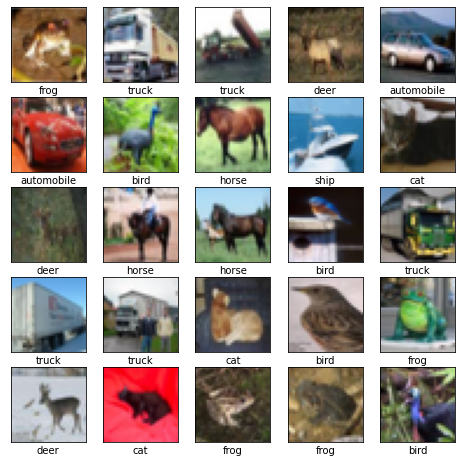

In [11]:
# let's check what individual samples in the training data look like just for verification

labels = ['airplane', 'automobile', 'bird', 'cat', 'deer',
               'dog', 'frog', 'horse', 'ship', 'truck']

plt.figure(figsize=(8,8))
for i in range(25):
    plt.subplot(5,5,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(x_train[i])
    plt.xlabel(labels[y_train[i][0]])
plt.show()



# Machine Learning Model

In [12]:
# Our base model below:
def define_model():
  """ This model is fairly simple, feel free to play with this part in pursuit of a better accuracy architecture.
  """
  shape = (32, 32, 3)
  input = Input(shape=shape)
  x = Conv2D(32, (3, 3), activation='relu')(input)
  x = MaxPooling2D()(x)

  x = Conv2D(64, (3, 3), activation='relu')(x)
  x = MaxPooling2D()(x)

  x = Conv2D(64, (3, 3), activation='relu')(x)
  x = MaxPooling2D()(x)

  x = Flatten()(x)
  x = Dense(128, activation='relu')(x)
  x = Dense(10)(x)
  model = Model(input, x)
  return model

In [13]:
model = define_model()
model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 32, 32, 3)]       0         
                                                                 
 conv2d (Conv2D)             (None, 30, 30, 32)        896       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 15, 15, 32)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 13, 13, 64)        18496     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 6, 6, 64)         0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 4, 4, 64)          36928 

In [14]:
# 2nd Base model below:
# def AlexnetModel(input_shape,num_classes):
#     model = Sequential()
# # model.add(Conv2D(96, (11,11), strides=(4,4), activation='relu', padding='same', input_shape=(img_height, img_width, channel,)))
# # for original Alexnet
#     model.add(Conv2D(48, (3,3), strides=(2,2), activation='relu', padding='same', input_shape=input_shape))
#     model.add(MaxPooling2D(pool_size=(2, 2), strides=(2,2)))
# # Local Response normalization for Original Alexnet
#     model.add(BatchNormalization())

#     model.add(Conv2D(96, (3,3), activation='relu', padding='same'))
#     model.add(MaxPooling2D(pool_size=(3, 3), strides=(2,2)))
# # Local Response normalization for Original Alexnet
#     model.add(BatchNormalization())

#     model.add(Conv2D(192, (3,3), activation='relu', padding='same'))
#     model.add(Conv2D(192, (3,3), activation='relu', padding='same'))
#     model.add(Conv2D(256, (3,3), activation='relu', padding='same'))
#     model.add(MaxPooling2D(pool_size=(3, 3), strides=(2,2)))
# # Local Response normalization for Original Alexnet
#     model.add(BatchNormalization())

#     model.add(Flatten())
#     model.add(Dense(512, activation='relu'))
#     model.add(Dropout(0.5))
#     model.add(Dense(256, activation='relu'))
#     model.add(Dropout(0.5))
#     model.add(Dense(num_classes, activation='softmax'))
#     return model

In [15]:
# shape = (32, 32, 3)
# num_class=10
# learning_rate=.01
#   # epochs=60
#   # M=5

In [16]:
# model1 = AlexnetModel(shape,num_class)
# model1.summary()

# Generating Subset of the Dataset

In [17]:
##divide xtrain n ytrain to 5 DISJOINT subsets
from sklearn.model_selection import StratifiedKFold
from tensorflow.keras.utils import to_categorical


M=5 ##defining the desired no. of subsets

X=x_train
Y=y_train
for i in range(0,M):
  K=M-i
  if(K>=2):
    train=X
    test=Y
    skf = StratifiedKFold(n_splits=K)
    skf.get_n_splits(X, Y)
    #print(skf)
    for train_index, test_index in skf.split(X, Y):
       #print(X.shape)
       X,globals()['x_train_split%s' % i]=train[train_index], train[test_index]
       Y,globals()['trainy_split%s' % i]=test[train_index], test[test_index]
       y_hot=globals()['trainy_split%s' % i]
       y_hot=to_categorical(y_hot)
       globals()['y_train_split%s' % i]=y_hot
       #X=train
       #Y=test
  elif K==1:
    globals()['x_train_split%s' % i]=X
    globals()['trainy_split%s' % i]=Y
    y_hot=to_categorical(Y)
    globals()['y_train_split%s' % i]=y_hot

In [18]:
## 5 disjoint set of the train data
d1_data = x_train_split0
d1_label = trainy_split0
d2_data= x_train_split1
d2_label=trainy_split1
d3_data= x_train_split2
d3_label=trainy_split2
d4_data= x_train_split3
d4_label=trainy_split3
d5_data= x_train_split4
d5_label=trainy_split4

In [19]:
d1_data.shape

(10000, 32, 32, 3)

In [20]:
d1_label.shape

(10000, 1)

In [21]:
skf.split(X, Y)

<generator object _BaseKFold.split at 0x7f78b1e4af90>

# Model Tuning

In [22]:
# specify parameters for model
optimizer = tf.keras.optimizers.Adam()
loss = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True)

# compile the model
model.compile(optimizer=optimizer, loss=loss, metrics=['accuracy'])



In [23]:
# # specify parameters for model1 [base model 2]
# optimizer = tf.keras.optimizers.Adam()
# loss = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True)

# # compile the model1
# model1.compile(optimizer=optimizer, loss=loss, metrics=['accuracy'])

## Model Training on subset 1

In [24]:
## fitting d1

# train the model with d1
history = model.fit(d1_data, d1_label,
                       validation_data=(x_test, y_test),
                       batch_size=128, 
                       epochs=30)
history

Epoch 1/30
79/79 [==============================] - 30s 363ms/step - loss: 2.0890 - accuracy: 0.2175 - val_loss: 1.8640 - val_accuracy: 0.3073
Epoch 2/30
79/79 [==============================] - 18s 225ms/step - loss: 1.7511 - accuracy: 0.3565 - val_loss: 1.6464 - val_accuracy: 0.3940
Epoch 3/30
79/79 [==============================] - 18s 230ms/step - loss: 1.6054 - accuracy: 0.4181 - val_loss: 1.5875 - val_accuracy: 0.4166
Epoch 4/30
79/79 [==============================] - 16s 207ms/step - loss: 1.5164 - accuracy: 0.4493 - val_loss: 1.5301 - val_accuracy: 0.4525
Epoch 5/30
79/79 [==============================] - 16s 209ms/step - loss: 1.4537 - accuracy: 0.4739 - val_loss: 1.4558 - val_accuracy: 0.4746
Epoch 6/30
79/79 [==============================] - 16s 209ms/step - loss: 1.3800 - accuracy: 0.5032 - val_loss: 1.4019 - val_accuracy: 0.4933
Epoch 7/30
79/79 [==============================] - 18s 232ms/step - loss: 1.3164 - accuracy: 0.5309 - val_loss: 1.3539 - val_accuracy: 0.5205

## Model Training on subset 2

In [25]:
## fitting d2

# train the model with d2
history2 = model.fit(d2_data, d2_label,
                       validation_data=(x_test, y_test),
                       batch_size=128, 
                       epochs=30)
history2

Epoch 1/30
79/79 [==============================] - 17s 220ms/step - loss: 1.2278 - accuracy: 0.5842 - val_loss: 1.0960 - val_accuracy: 0.6173
Epoch 2/30
79/79 [==============================] - 17s 216ms/step - loss: 1.0426 - accuracy: 0.6355 - val_loss: 1.1204 - val_accuracy: 0.6178
Epoch 3/30
79/79 [==============================] - 17s 217ms/step - loss: 0.9928 - accuracy: 0.6516 - val_loss: 1.1065 - val_accuracy: 0.6138
Epoch 4/30
79/79 [==============================] - 20s 256ms/step - loss: 0.9334 - accuracy: 0.6727 - val_loss: 1.0790 - val_accuracy: 0.6281
Epoch 5/30
79/79 [==============================] - 17s 217ms/step - loss: 0.8823 - accuracy: 0.6953 - val_loss: 1.0796 - val_accuracy: 0.6250
Epoch 6/30
79/79 [==============================] - 17s 218ms/step - loss: 0.8540 - accuracy: 0.7034 - val_loss: 1.0406 - val_accuracy: 0.6399
Epoch 7/30
79/79 [==============================] - 17s 216ms/step - loss: 0.8150 - accuracy: 0.7158 - val_loss: 1.0730 - val_accuracy: 0.6289

## Model Training on subset 3

In [26]:
## fitting d3

# train the model with d3
history3 = model.fit(d3_data, d3_label,
                       validation_data=(x_test, y_test),
                       batch_size=128, 
                       epochs=30)
history3

Epoch 1/30
79/79 [==============================] - 17s 214ms/step - loss: 1.2659 - accuracy: 0.6058 - val_loss: 1.0962 - val_accuracy: 0.6185
Epoch 2/30
79/79 [==============================] - 17s 211ms/step - loss: 0.9580 - accuracy: 0.6690 - val_loss: 1.0350 - val_accuracy: 0.6417
Epoch 3/30
79/79 [==============================] - 18s 233ms/step - loss: 0.8616 - accuracy: 0.7020 - val_loss: 1.0165 - val_accuracy: 0.6521
Epoch 4/30
79/79 [==============================] - 17s 213ms/step - loss: 0.7827 - accuracy: 0.7326 - val_loss: 1.0209 - val_accuracy: 0.6538
Epoch 5/30
79/79 [==============================] - 17s 213ms/step - loss: 0.7362 - accuracy: 0.7488 - val_loss: 1.0566 - val_accuracy: 0.6431
Epoch 6/30
79/79 [==============================] - 17s 211ms/step - loss: 0.6837 - accuracy: 0.7671 - val_loss: 1.0519 - val_accuracy: 0.6462
Epoch 7/30
79/79 [==============================] - 20s 249ms/step - loss: 0.6450 - accuracy: 0.7756 - val_loss: 1.0798 - val_accuracy: 0.6509

## Model Training on subset 4

In [27]:
## fitting d4

# train the model with d4
history4 = model.fit(d4_data, d4_label,
                       validation_data=(x_test, y_test),
                       batch_size=128, 
                       epochs=30)
history4

Epoch 1/30
79/79 [==============================] - 17s 213ms/step - loss: 1.3584 - accuracy: 0.5949 - val_loss: 1.1143 - val_accuracy: 0.6208
Epoch 2/30
79/79 [==============================] - 17s 211ms/step - loss: 0.9554 - accuracy: 0.6719 - val_loss: 1.0789 - val_accuracy: 0.6309
Epoch 3/30
79/79 [==============================] - 17s 210ms/step - loss: 0.8264 - accuracy: 0.7108 - val_loss: 1.0894 - val_accuracy: 0.6339
Epoch 4/30
79/79 [==============================] - 17s 210ms/step - loss: 0.7453 - accuracy: 0.7425 - val_loss: 1.0717 - val_accuracy: 0.6426
Epoch 5/30
79/79 [==============================] - 17s 212ms/step - loss: 0.6927 - accuracy: 0.7589 - val_loss: 1.0990 - val_accuracy: 0.6403
Epoch 6/30
79/79 [==============================] - 17s 210ms/step - loss: 0.6042 - accuracy: 0.7917 - val_loss: 1.1113 - val_accuracy: 0.6474
Epoch 7/30
79/79 [==============================] - 17s 210ms/step - loss: 0.5523 - accuracy: 0.8062 - val_loss: 1.1104 - val_accuracy: 0.6475

## Model Training on subset 5

In [28]:
## fitting d5

# train the model with d5
history5 = model.fit(d5_data, d5_label,
                       validation_data=(x_test, y_test),
                       batch_size=128, 
                       epochs=30)
history5

Epoch 1/30
79/79 [==============================] - 18s 226ms/step - loss: 1.3883 - accuracy: 0.5835 - val_loss: 1.1230 - val_accuracy: 0.6119
Epoch 2/30
79/79 [==============================] - 19s 234ms/step - loss: 0.9564 - accuracy: 0.6714 - val_loss: 1.0701 - val_accuracy: 0.6287
Epoch 3/30
79/79 [==============================] - 16s 208ms/step - loss: 0.8169 - accuracy: 0.7136 - val_loss: 1.0508 - val_accuracy: 0.6483
Epoch 4/30
79/79 [==============================] - 17s 211ms/step - loss: 0.7192 - accuracy: 0.7458 - val_loss: 1.0685 - val_accuracy: 0.6450
Epoch 5/30
79/79 [==============================] - 16s 209ms/step - loss: 0.6485 - accuracy: 0.7739 - val_loss: 1.0621 - val_accuracy: 0.6593
Epoch 6/30
79/79 [==============================] - 17s 210ms/step - loss: 0.5587 - accuracy: 0.8037 - val_loss: 1.0789 - val_accuracy: 0.6568
Epoch 7/30
79/79 [==============================] - 17s 212ms/step - loss: 0.5040 - accuracy: 0.8199 - val_loss: 1.1345 - val_accuracy: 0.6626

# Plot Model Evaluation

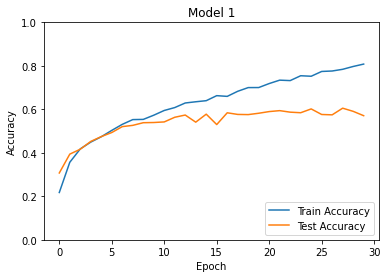

In [29]:
# evalaute model accuracy for d1
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label = 'Test Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.ylim([0, 1])
plt.title("Model 1")
plt.legend(loc='lower right')

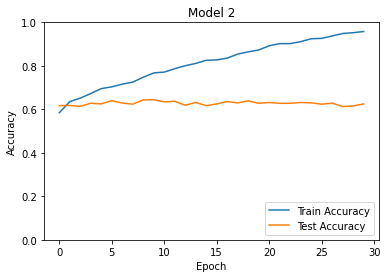

In [30]:
# evalaute model2 accuracy
plt.plot(history2.history['accuracy'], label='Train Accuracy')
plt.plot(history2.history['val_accuracy'], label = 'Test Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.ylim([0, 1])
plt.title("Model 2")
plt.legend(loc='lower right')

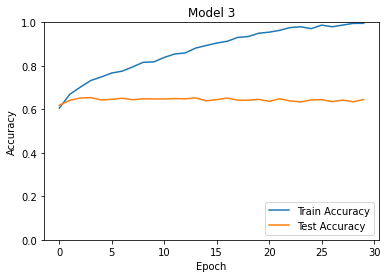

In [31]:
# evalaute model3 accuracy
plt.plot(history3.history['accuracy'], label='Train Accuracy')
plt.plot(history3.history['val_accuracy'], label = 'Test Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.ylim([0, 1])
plt.title("Model 3")
plt.legend(loc='lower right')

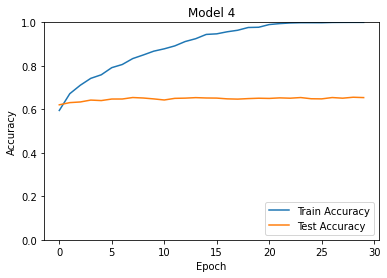

In [32]:
# evalaute model4 accuracy
plt.plot(history4.history['accuracy'], label='Train Accuracy')
plt.plot(history4.history['val_accuracy'], label = 'Test Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.ylim([0, 1])
plt.title("Model 4")
plt.legend(loc='lower right')

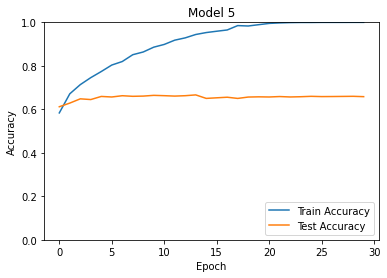

In [33]:
# evalaute model5 accuracy
plt.plot(history5.history['accuracy'], label='Train Accuracy')
plt.plot(history5.history['val_accuracy'], label = 'Test Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.ylim([0, 1])
plt.title("Model 5")
plt.legend(loc='lower right')

# Generating Prediction Vector for member subset 1

In [34]:
print('Predict on train...')
logits_train1 = model.predict(d1_data)
print('Predict on test...')
logits_test1 = model.predict(x_test)

print('Apply softmax to get probabilities from logits...')
prob_train1 = tf.nn.softmax(logits_train1, axis=-1)
prob_test1 = tf.nn.softmax(logits_test1)

print('Compute losses...')
cce = tf.keras.backend.categorical_crossentropy
constant = tf.keras.backend.constant

y_train_onehot = to_categorical(d1_label)
y_test_onehot = to_categorical(y_test)

loss_train1 = cce(constant(y_train_onehot), constant(prob_train1), from_logits=False).numpy()
loss_test1 = cce(constant(y_test_onehot), constant(prob_test1), from_logits=False).numpy()

index1 = 0
for p in logits_train1:
  print( p, np.argmax(p),y_test[index1])
  index1+=1

Streaming output truncated to the last 5000 lines.
   2.7870984  -4.337487  -11.916114  -18.082893 ] 6 [7]
[  5.603824     0.18252379  -8.421404   -13.370626   -22.145113
  -3.5358975  -19.494162    -9.8879795   -3.5123005   20.538313  ] 9 [8]
[-23.094652   -12.847495   -11.401288    -4.665102     0.91938883
 -11.563141    -5.59971     16.105103   -19.577559    -1.4357703 ] 7 [1]
[ -7.582224  -18.99126     1.5792245   8.807021    2.014191    3.7537205
 -12.958413    5.135402  -22.665174  -20.10268  ] 3 [2]
[  0.61939347 -18.063644     7.7398043    1.581964    -1.5433655
 -11.349654   -10.525496    -5.7564487   -5.4646864   -1.2200153 ] 2 [3]
[  4.2951517  48.770287  -32.017414  -32.8611    -51.4999    -35.838394
 -18.509562  -12.955793  -11.282198   13.156681 ] 1 [2]
[ 16.704323    -3.0499732   -9.430169   -12.930432   -12.57234
 -19.44995     -2.9237835  -17.28266      0.03859556  -5.542059  ] 0 [4]
[ -7.1294518   9.427256   -8.428692  -13.210848  -13.145727   -6.0025167
  -2.4649296 

# Generating Prediction Vector for member subset 2

In [35]:
print('Predict on train...')
logits_train2 = model.predict(d2_data)
print('Predict on test...')
logits_test2 = model.predict(x_test)

print('Apply softmax to get probabilities from logits...')
prob_train2 = tf.nn.softmax(logits_train2, axis=-1)
prob_test2 = tf.nn.softmax(logits_test2)

# print('Compute losses...')
# cce = tf.keras.backend.categorical_crossentropy
# constant = tf.keras.backend.constant

y_train_secondhot = to_categorical(d2_label)
y_test_secondhot = to_categorical(y_test)

loss_train2 = cce(constant(y_train_secondhot), constant(prob_train2), from_logits=False).numpy()
loss_test2 = cce(constant(y_test_secondhot), constant(prob_test2), from_logits=False).numpy()

index1 = 0
for p in logits_train2:
  print( p, np.argmax(p),y_test[index1])
  index1+=1

Streaming output truncated to the last 5000 lines.
[ -0.5403349   6.639344   -5.0750175  -5.1107483  -9.78195   -15.543285
 -11.752535   -7.896226   -6.8004827   4.158818 ] 1 [9]
[-15.183858  -17.368437    5.039549    3.4887342  11.357692   -2.677596
 -18.06343   -15.096946  -15.576062  -21.789076 ] 4 [0]
[-3.338234   -5.573478   -2.0711446   0.4115426  -9.468555    0.19598588
  2.0896184  -0.749702   -0.7892069  -1.6523322 ] 6 [7]
[-21.796337  -12.274657    5.6701455  -8.254877   -5.9484344   2.8096235
   3.596276   -2.207114   -8.588889   -3.8205678] 2 [8]
[-13.0060425   9.568305  -37.500225  -27.448465  -32.84513   -13.250549
 -12.892224  -28.496712   23.240145   20.083626 ] 8 [1]
[ 16.204863  -11.891903    4.1544237 -17.187862   -7.5016484 -23.886639
 -35.507656  -25.863379    3.5444245 -16.092527 ] 0 [2]
[-18.307117  -19.28535     9.620975   -0.4790811  -3.670671   -8.045665
  12.895124  -12.814762  -19.737505  -13.757699 ] 6 [3]
[  7.2845116    0.66093963 -16.127348     2.6338017

# Generating Prediction Vector for member subset 3

In [36]:
print('Predict on train...')
logits_train3 = model.predict(d3_data)
print('Predict on test...')
logits_test3 = model.predict(x_test)

print('Apply softmax to get probabilities from logits...')
prob_train3 = tf.nn.softmax(logits_train3, axis=-1)
prob_test3 = tf.nn.softmax(logits_test3)

# print('Compute losses...')
# cce = tf.keras.backend.categorical_crossentropy
# constant = tf.keras.backend.constant

y_train_thirdhot = to_categorical(d3_label)
y_test_thirdhot = to_categorical(y_test)

loss_train3 = cce(constant(y_train_thirdhot), constant(prob_train3), from_logits=False).numpy()
loss_test3 = cce(constant(y_test_thirdhot), constant(prob_test3), from_logits=False).numpy()

index1 = 0
for p in logits_train3:
  print( p, np.argmax(p),y_test[index1])
  index1+=1

Streaming output truncated to the last 5000 lines.
 -11.119098   -2.0898402 -13.703883  -22.00873  ] 5 [4]
[ -9.202888  -19.107548   14.717625  -18.094482   20.88136    -5.2521152
 -15.524311    0.5969478 -14.492288  -27.999075 ] 4 [2]
[ 20.020306   -2.5129044  -5.886386  -28.219881  -12.636928  -12.60195
 -25.582829   -6.946932    1.9448452   1.7363124] 0 [9]
[  0.88050115 -18.564457    -4.0766745  -24.46949     -5.8991055
 -14.433217    -4.680053    -7.6954517   -7.9329677   20.126263  ] 9 [0]
[  6.4635653  -8.164108   -5.6478896  -7.426659  -17.678062   -9.3008585
 -13.082507  -15.901223   13.044781   -2.2962732] 8 [3]
[ -1.6473758 -12.139588   -3.2895496   5.1253185 -12.201812   -3.8267853
  -3.0445166 -12.571586   -3.0050466  -6.792694 ] 3 [8]
[-7.9943686  -4.452322   -3.936583    3.3717742  -5.9624023   1.8258457
 -0.08358812 -4.2891974  -8.316194   -6.472191  ] 3 [9]
[-13.731452   -5.341182   -4.6876187   7.7473125  -1.9479866  -1.7298901
  -6.496919   -6.583977    0.5707529  -2

# Generating Prediction Vector for member subset 4

In [37]:
print('Predict on train...')
logits_train4 = model.predict(d4_data)
print('Predict on test...')
logits_test4 = model.predict(x_test)

print('Apply softmax to get probabilities from logits...')
prob_train4 = tf.nn.softmax(logits_train4, axis=-1)
prob_test4 = tf.nn.softmax(logits_test4)

# print('Compute losses...')
# cce = tf.keras.backend.categorical_crossentropy
# constant = tf.keras.backend.constant

y_train_forthhot = to_categorical(d4_label)
y_test_forthhot = to_categorical(y_test)

loss_train4 = cce(constant(y_train_forthhot), constant(prob_train4), from_logits=False).numpy()
loss_test4 = cce(constant(y_test_forthhot), constant(prob_test4), from_logits=False).numpy()

index1 = 0
for p in logits_train4:
  print( p, np.argmax(p),y_test[index1])
  index1+=1

Streaming output truncated to the last 5000 lines.
 -11.064621   -4.6906147 -11.600206  -13.728666 ] 5 [3]
[  8.503095   -3.382494   -3.6646605 -16.376673   -7.249267  -19.26558
 -21.242443   -7.8457217  12.365597   -4.1303062] 8 [2]
[ 14.026624  -20.225529  -14.461948   -1.5196447   3.0032322  -5.981137
  -6.166109   -6.7536564 -15.325145  -19.825401 ] 0 [4]
[-17.134548   -25.560102    -3.9267113   -0.24240713   4.7582593
  -2.2466047  -12.8985405   19.411499   -20.069681    -2.8794875 ] 7 [2]
[ -5.562664  -18.793518    7.9207106  -1.7451121   3.8583238  -3.9339767
 -10.339522   -3.1622152 -14.071209  -12.966567 ] 2 [9]
[-19.386501  -14.221524   -8.453921    3.4869378  -0.6798961  -5.9803605
  15.993515  -16.485283  -18.174986  -13.040774 ] 6 [0]
[-10.98315   -10.402244    0.7168564  -0.9428888   2.1490972  -1.1571256
  -9.206811    0.5470318  -8.1998205  -5.392745 ] 4 [3]
[ 10.834665   -2.4719415  -7.167665  -12.132987   -4.8787913 -20.416433
 -26.802856  -11.324177   12.450787    0.

# Generating Prediction Vector for member subset 5

In [38]:
print('Predict on train...')
logits_train5 = model.predict(d5_data)
print('Predict on test...')
logits_test5 = model.predict(x_test)

print('Apply softmax to get probabilities from logits...')
prob_train5 = tf.nn.softmax(logits_train5, axis=-1)
prob_test5 = tf.nn.softmax(logits_test5)

# print('Compute losses...')
# cce = tf.keras.backend.categorical_crossentropy
# constant = tf.keras.backend.constant

y_train_fifthhot = to_categorical(d5_label)
y_test_fifthhot = to_categorical(y_test)

loss_train5 = cce(constant(y_train_fifthhot), constant(prob_train5), from_logits=False).numpy()
loss_test5 = cce(constant(y_test_fifthhot), constant(prob_test5), from_logits=False).numpy()

index1 = 0
for p in logits_train5:
  print( p, np.argmax(p),y_test[index1])
  index1+=1

Streaming output truncated to the last 5000 lines.
[ -9.720851  -10.818521   -4.0296273  -0.7117244  -3.211596   -5.444326
  -4.9690413  -1.2652645 -13.02018     9.441284 ] 9 [9]
[ -3.3506818   9.016751  -11.818467   -5.3728333  -8.285996   -4.8210645
 -11.012017  -11.296105   -0.7860041   4.3229995] 1 [0]
[  8.447729    -8.412972    -6.3975205  -16.708414    -1.9233205
 -15.1565695  -17.685555   -12.230225    12.8647785    0.84458697] 8 [7]
[-6.00808    -6.284708   -9.130966    2.9101431  -0.24899818  6.5104055
 -9.532486   -0.7362667  -8.859558   -7.711976  ] 5 [8]
[-15.944331  -10.557444   -3.1074715  -2.3092124  -6.7997293 -11.576695
  18.37985    -8.412254  -20.099314  -15.622465 ] 6 [1]
[-10.897379   -16.880737    -0.22441415   5.605277    -3.0124872
   1.4292482   -4.4772253   -6.755015    -4.887678   -14.14513   ] 3 [2]
[ -1.7429653  -8.687274    2.5062728  -1.1405661  -1.4137918   5.5161653
  -3.2358894  -4.223484   -6.3956523 -10.264164 ] 5 [3]
[-19.444195  -12.7829275  -6.27

In [39]:
!pip install tensorflow-model-remediation

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 142 kB 17.9 MB/s 


# ATTACK on Subset 1 - Threshold attack:



In [40]:
# define what variables our attacker should have access to

attack_input1 = AttackInputData(
  logits_train = logits_train1,
  logits_test = logits_test1,
  loss_train = loss_train1,
  loss_test = loss_test1,
  labels_train = d1_label.reshape(d1_label.shape[0]),
  labels_test = y_test.reshape(y_test.shape[0],)
) 

In [41]:
# how should the data be sliced
slicing_spec = SlicingSpec(
    entire_dataset = True,
    by_class = True,
    by_percentiles = False,
by_classification_correctness = True)

In [42]:
#defining the attack type
attack_types = [
    AttackType.THRESHOLD_ATTACK,
    AttackType.LOGISTIC_REGRESSION
] 

In [43]:
attacks_result1 = mia.run_attacks(attack_input=attack_input1,
                                 slicing_spec=slicing_spec,
                                 attack_types=attack_types)

In [44]:
attacks_result1.summary

<bound method AttackResults.summary of AttackResults(single_attack_results=[SingleAttackResult(slice_spec=SingleSliceSpec(feature=None, value=None), data_size=DataSize(ntrain=10000, ntest=10000), attack_type=<AttackType.THRESHOLD_ATTACK: 'threshold'>, roc_curve=RocCurve(thresholds=array([1.7118095e+01, 1.6118095e+01, 1.6109955e+01, ..., 2.3841861e-07,
       1.7881395e-07, 1.1920930e-07], dtype=float32), tpr=array([0.    , 0.0249, 0.025 , ..., 0.8509, 0.8571, 1.    ]), fpr=array([0.    , 0.0182, 0.0182, ..., 0.8491, 0.855 , 1.    ]), test_train_ratio=1.0), membership_scores_train=array([2.9802325e-07, 1.6118095e+01, 2.2914369e+00, ..., 5.4836423e-06,
       1.2219027e-05, 4.2401400e+00], dtype=float32), membership_scores_test=array([3.5373934e-02, 1.1920930e-07, 3.7510277e-04, ..., 1.3113031e-06,
       4.4843727e-01, 1.6870810e-02], dtype=float32)), SingleAttackResult(slice_spec=SingleSliceSpec(feature=None, value=None), data_size=DataSize(ntrain=10000, ntest=10000), attack_type=<Atta

## Validate attack results of subset 1



In [45]:

attacks_result1.summary()

'Best-performing attacks over all slices\n  THRESHOLD_ATTACK (with 1000 training and 1000 test examples) achieved an AUC of 0.54 on slice CLASS=2\n  THRESHOLD_ATTACK (with 1000 training and 1000 test examples) achieved an advantage of 0.07 on slice CLASS=2\n  LOGISTIC_REGRESSION (with 1000 training and 1000 test examples) achieved a positive predictive value of 1.00 on slice CLASS=2'

In [46]:
attacks_result1.summary(by_slices = True)

'Best-performing attacks over all slices\n  THRESHOLD_ATTACK (with 1000 training and 1000 test examples) achieved an AUC of 0.54 on slice CLASS=2\n  THRESHOLD_ATTACK (with 1000 training and 1000 test examples) achieved an advantage of 0.07 on slice CLASS=2\n  LOGISTIC_REGRESSION (with 1000 training and 1000 test examples) achieved a positive predictive value of 1.00 on slice CLASS=2\n\nBest-performing attacks over slice: "Entire dataset"\n  THRESHOLD_ATTACK (with 10000 training and 10000 test examples) achieved an AUC of 0.52\n  THRESHOLD_ATTACK (with 10000 training and 10000 test examples) achieved an advantage of 0.03\n  THRESHOLD_ATTACK (with 10000 training and 10000 test examples) achieved a positive predictive value of 0.58\n\nBest-performing attacks over slice: "CLASS=0"\n  LOGISTIC_REGRESSION (with 1000 training and 1000 test examples) achieved an AUC of 0.51\n  LOGISTIC_REGRESSION (with 1000 training and 1000 test examples) achieved an advantage of 0.04\n  THRESHOLD_ATTACK (wit

## Plotting the attack result to visualize the accuracy [subset1]

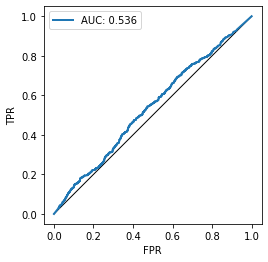

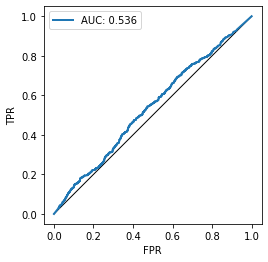

In [47]:
import tensorflow_privacy.privacy.membership_inference_attack.plotting as miaplt
miaplt.plot_roc_curve(attacks_result1.get_result_with_max_auc().roc_curve)

In [48]:
# PRE

# ATTACK on Subset 2 - Threshold attack:



In [49]:
# define what variables our attacker should have access to

attack_input2 = AttackInputData(
  logits_train = logits_train2,
  logits_test = logits_test2,
  loss_train = loss_train2,
  loss_test = loss_test2,
  labels_train = d2_label.reshape(d2_label.shape[0]),
  labels_test = y_test.reshape(y_test.shape[0],)
) 

In [50]:
# how should the data be sliced
# slicing_spec = SlicingSpec(
#     entire_dataset = True,
#     by_class = True,
#     by_percentiles = False,
# by_classification_correctness = True)

In [51]:
#defining the attack type
# attack_types = [
#     AttackType.THRESHOLD_ATTACK,
#     AttackType.LOGISTIC_REGRESSION
# ] 

In [52]:
attacks_result2 = mia.run_attacks(attack_input=attack_input2,
                                 slicing_spec=slicing_spec,
                                 attack_types=attack_types)

In [53]:
attacks_result2.summary

<bound method AttackResults.summary of AttackResults(single_attack_results=[SingleAttackResult(slice_spec=SingleSliceSpec(feature=None, value=None), data_size=DataSize(ntrain=10000, ntest=10000), attack_type=<AttackType.THRESHOLD_ATTACK: 'threshold'>, roc_curve=RocCurve(thresholds=array([1.7118095e+01, 1.6118095e+01, 1.6116158e+01, ..., 2.3841861e-07,
       1.7881395e-07, 1.1920930e-07], dtype=float32), tpr=array([0.    , 0.0249, 0.0249, ..., 0.8509, 0.8571, 1.    ]), fpr=array([0.    , 0.0159, 0.016 , ..., 0.848 , 0.855 , 1.    ]), test_train_ratio=1.0), membership_scores_train=array([1.1920930e-07, 3.6426887e-03, 6.7858554e-02, ..., 9.5583498e-01,
       2.3475581e-01, 8.6132415e-05], dtype=float32), membership_scores_test=array([3.5373934e-02, 1.1920930e-07, 3.7510277e-04, ..., 1.3113031e-06,
       4.4843727e-01, 1.6870810e-02], dtype=float32)), SingleAttackResult(slice_spec=SingleSliceSpec(feature=None, value=None), data_size=DataSize(ntrain=10000, ntest=10000), attack_type=<Atta

## Validate attack results of subset 2



In [54]:

attacks_result2.summary()

'Best-performing attacks over all slices\n  THRESHOLD_ATTACK (with 1000 training and 1000 test examples) achieved an AUC of 0.55 on slice CLASS=3\n  THRESHOLD_ATTACK (with 1000 training and 1000 test examples) achieved an advantage of 0.09 on slice CLASS=5\n  LOGISTIC_REGRESSION (with 1000 training and 1000 test examples) achieved a positive predictive value of 1.00 on slice CLASS=3'

In [55]:
attacks_result2.summary(by_slices = True)

'Best-performing attacks over all slices\n  THRESHOLD_ATTACK (with 1000 training and 1000 test examples) achieved an AUC of 0.55 on slice CLASS=3\n  THRESHOLD_ATTACK (with 1000 training and 1000 test examples) achieved an advantage of 0.09 on slice CLASS=5\n  LOGISTIC_REGRESSION (with 1000 training and 1000 test examples) achieved a positive predictive value of 1.00 on slice CLASS=3\n\nBest-performing attacks over slice: "Entire dataset"\n  THRESHOLD_ATTACK (with 10000 training and 10000 test examples) achieved an AUC of 0.52\n  THRESHOLD_ATTACK (with 10000 training and 10000 test examples) achieved an advantage of 0.04\n  LOGISTIC_REGRESSION (with 10000 training and 10000 test examples) achieved a positive predictive value of 0.75\n\nBest-performing attacks over slice: "CLASS=0"\n  THRESHOLD_ATTACK (with 1000 training and 1000 test examples) achieved an AUC of 0.51\n  LOGISTIC_REGRESSION (with 1000 training and 1000 test examples) achieved an advantage of 0.06\n  THRESHOLD_ATTACK (wit

## Plotting the attack result to visualize the accuracy [subset2]

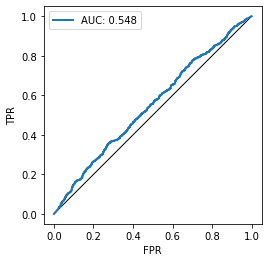

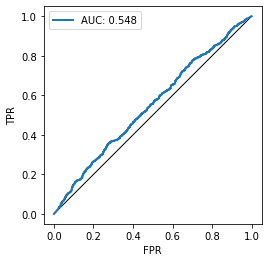

In [56]:
import tensorflow_privacy.privacy.membership_inference_attack.plotting as miaplt
miaplt.plot_roc_curve(attacks_result2.get_result_with_max_auc().roc_curve)

In [57]:
# PRE

# ATTACK on Subset 3 - Threshold attack:



In [58]:
# define what variables our attacker should have access to

attack_input3 = AttackInputData(
  logits_train = logits_train3,
  logits_test = logits_test3,
  loss_train = loss_train3,
  loss_test = loss_test3,
  labels_train = d3_label.reshape(d3_label.shape[0]),
  labels_test = y_test.reshape(y_test.shape[0],)
) 

In [59]:
# how should the data be sliced
# slicing_spec = SlicingSpec(
#     entire_dataset = True,
#     by_class = True,
#     by_percentiles = False,
# by_classification_correctness = True)

In [60]:
#defining the attack type
# attack_types = [
#     AttackType.THRESHOLD_ATTACK,
#     AttackType.LOGISTIC_REGRESSION
# ] 

In [61]:
attacks_result3 = mia.run_attacks(attack_input=attack_input3,
                                 slicing_spec=slicing_spec,
                                 attack_types=attack_types)

In [62]:
attacks_result3.summary

<bound method AttackResults.summary of AttackResults(single_attack_results=[SingleAttackResult(slice_spec=SingleSliceSpec(feature=None, value=None), data_size=DataSize(ntrain=10000, ntest=10000), attack_type=<AttackType.THRESHOLD_ATTACK: 'threshold'>, roc_curve=RocCurve(thresholds=array([1.7118095e+01, 1.6118095e+01, 1.6106009e+01, ..., 2.3841861e-07,
       1.7881395e-07, 1.1920930e-07], dtype=float32), tpr=array([0.    , 0.0249, 0.0251, ..., 0.8509, 0.8571, 1.    ]), fpr=array([0.    , 0.0094, 0.0094, ..., 0.8475, 0.855 , 1.    ]), test_train_ratio=1.0), membership_scores_train=array([8.3495417e+00, 7.7892259e-02, 5.4043031e+00, ..., 2.5740545e-02,
       1.7881395e-07, 5.4836423e-06], dtype=float32), membership_scores_test=array([3.5373934e-02, 1.1920930e-07, 3.7510277e-04, ..., 1.3113031e-06,
       4.4843727e-01, 1.6870810e-02], dtype=float32)), SingleAttackResult(slice_spec=SingleSliceSpec(feature=None, value=None), data_size=DataSize(ntrain=10000, ntest=10000), attack_type=<Atta

## Validate attack results of subset 3



In [63]:

attacks_result3.summary()

'Best-performing attacks over all slices\n  THRESHOLD_ATTACK (with 1000 training and 1000 test examples) achieved an AUC of 0.59 on slice CLASS=4\n  THRESHOLD_ATTACK (with 1000 training and 1000 test examples) achieved an advantage of 0.14 on slice CLASS=4\n  LOGISTIC_REGRESSION (with 1000 training and 1000 test examples) achieved a positive predictive value of 1.00 on slice CLASS=1'

In [64]:
attacks_result3.summary(by_slices = True)

'Best-performing attacks over all slices\n  THRESHOLD_ATTACK (with 1000 training and 1000 test examples) achieved an AUC of 0.59 on slice CLASS=4\n  THRESHOLD_ATTACK (with 1000 training and 1000 test examples) achieved an advantage of 0.14 on slice CLASS=4\n  LOGISTIC_REGRESSION (with 1000 training and 1000 test examples) achieved a positive predictive value of 1.00 on slice CLASS=1\n\nBest-performing attacks over slice: "Entire dataset"\n  LOGISTIC_REGRESSION (with 10000 training and 10000 test examples) achieved an AUC of 0.54\n  THRESHOLD_ATTACK (with 10000 training and 10000 test examples) achieved an advantage of 0.07\n  LOGISTIC_REGRESSION (with 10000 training and 10000 test examples) achieved a positive predictive value of 0.88\n\nBest-performing attacks over slice: "CLASS=0"\n  THRESHOLD_ATTACK (with 1000 training and 1000 test examples) achieved an AUC of 0.52\n  THRESHOLD_ATTACK (with 1000 training and 1000 test examples) achieved an advantage of 0.05\n  LOGISTIC_REGRESSION (

## Plotting the attack result to visualize the accuracy [subset3]

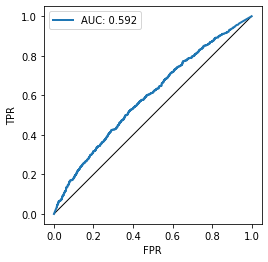

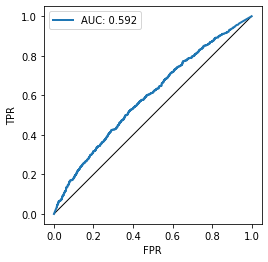

In [65]:
import tensorflow_privacy.privacy.membership_inference_attack.plotting as miaplt
miaplt.plot_roc_curve(attacks_result3.get_result_with_max_auc().roc_curve)

In [66]:
# PRE

# ATTACK on Subset 4 - Threshold attack:



In [67]:
# define what variables our attacker should have access to

attack_input4 = AttackInputData(
  logits_train = logits_train4,
  logits_test = logits_test4,
  loss_train = loss_train4,
  loss_test = loss_test4,
  labels_train = d4_label.reshape(d4_label.shape[0]),
  labels_test = y_test.reshape(y_test.shape[0],)
) 

In [68]:
# how should the data be sliced
# slicing_spec = SlicingSpec(
#     entire_dataset = True,
#     by_class = True,
#     by_percentiles = False,
# by_classification_correctness = True)

In [69]:
#defining the attack type
# attack_types = [
#     AttackType.THRESHOLD_ATTACK,
#     AttackType.LOGISTIC_REGRESSION
# ] 

In [70]:
attacks_result4 = mia.run_attacks(attack_input=attack_input4,
                                 slicing_spec=slicing_spec,
                                 attack_types=attack_types)

In [71]:
attacks_result4.summary

<bound method AttackResults.summary of AttackResults(single_attack_results=[SingleAttackResult(slice_spec=SingleSliceSpec(feature=None, value=None), data_size=DataSize(ntrain=10000, ntest=10000), attack_type=<AttackType.THRESHOLD_ATTACK: 'threshold'>, roc_curve=RocCurve(thresholds=array([1.7118095e+01, 1.6118095e+01, 1.6106009e+01, ..., 2.3841861e-07,
       1.7881395e-07, 1.1920930e-07], dtype=float32), tpr=array([0.    , 0.0249, 0.0251, ..., 0.8509, 0.8571, 1.    ]), fpr=array([0.    , 0.0038, 0.0038, ..., 0.8398, 0.8482, 1.    ]), test_train_ratio=1.0), membership_scores_train=array([1.04675516e-01, 6.18077695e-01, 1.00558085e-04, ...,
       1.08408518e-02, 1.57737541e+01, 4.87249112e-03], dtype=float32), membership_scores_test=array([3.5373934e-02, 1.1920930e-07, 3.7510277e-04, ..., 1.3113031e-06,
       4.4843727e-01, 1.6870810e-02], dtype=float32)), SingleAttackResult(slice_spec=SingleSliceSpec(feature=None, value=None), data_size=DataSize(ntrain=10000, ntest=10000), attack_type

## Validate attack results of subset 4



In [72]:

attacks_result4.summary()

'Best-performing attacks over all slices\n  THRESHOLD_ATTACK (with 1000 training and 1000 test examples) achieved an AUC of 0.60 on slice CLASS=3\n  THRESHOLD_ATTACK (with 1000 training and 1000 test examples) achieved an advantage of 0.18 on slice CLASS=3\n  LOGISTIC_REGRESSION (with 1000 training and 1000 test examples) achieved a positive predictive value of 1.00 on slice CLASS=0'

In [73]:
attacks_result4.summary(by_slices = True)

'Best-performing attacks over all slices\n  THRESHOLD_ATTACK (with 1000 training and 1000 test examples) achieved an AUC of 0.60 on slice CLASS=3\n  THRESHOLD_ATTACK (with 1000 training and 1000 test examples) achieved an advantage of 0.18 on slice CLASS=3\n  LOGISTIC_REGRESSION (with 1000 training and 1000 test examples) achieved a positive predictive value of 1.00 on slice CLASS=0\n\nBest-performing attacks over slice: "Entire dataset"\n  LOGISTIC_REGRESSION (with 10000 training and 10000 test examples) achieved an AUC of 0.57\n  THRESHOLD_ATTACK (with 10000 training and 10000 test examples) achieved an advantage of 0.11\n  LOGISTIC_REGRESSION (with 10000 training and 10000 test examples) achieved a positive predictive value of 0.92\n\nBest-performing attacks over slice: "CLASS=0"\n  THRESHOLD_ATTACK (with 1000 training and 1000 test examples) achieved an AUC of 0.54\n  THRESHOLD_ATTACK (with 1000 training and 1000 test examples) achieved an advantage of 0.09\n  LOGISTIC_REGRESSION (

## Plotting the attack result to visualize the accuracy [subset4]

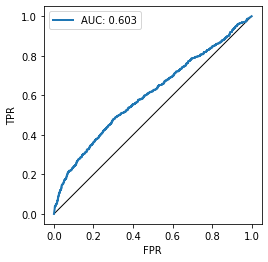

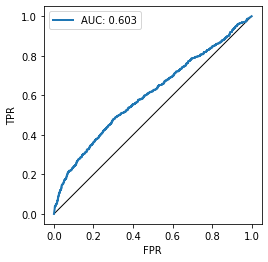

In [74]:
import tensorflow_privacy.privacy.membership_inference_attack.plotting as miaplt
miaplt.plot_roc_curve(attacks_result4.get_result_with_max_auc().roc_curve)

In [75]:
# PRE

# ATTACK on Subset 5 - Threshold attack:



In [76]:
# define what variables our attacker should have access to

attack_input5 = AttackInputData(
  logits_train = logits_train5,
  logits_test = logits_test5,
  loss_train = loss_train5,
  loss_test = loss_test5,
  labels_train = d5_label.reshape(d5_label.shape[0]),
  labels_test = y_test.reshape(y_test.shape[0],)
) 

In [77]:
# how should the data be sliced
# slicing_spec = SlicingSpec(
#     entire_dataset = True,
#     by_class = True,
#     by_percentiles = False,
# by_classification_correctness = True)

In [78]:
#defining the attack type
# attack_types = [
#     AttackType.THRESHOLD_ATTACK,
#     AttackType.LOGISTIC_REGRESSION
# ] 

In [79]:
attacks_result5 = mia.run_attacks(attack_input=attack_input5,
                                 slicing_spec=slicing_spec,
                                 attack_types=attack_types)

In [80]:
attacks_result5.summary

<bound method AttackResults.summary of AttackResults(single_attack_results=[SingleAttackResult(slice_spec=SingleSliceSpec(feature=None, value=None), data_size=DataSize(ntrain=10000, ntest=10000), attack_type=<AttackType.THRESHOLD_ATTACK: 'threshold'>, roc_curve=RocCurve(thresholds=array([1.7118095e+01, 1.6118095e+01, 1.1182565e+01, ..., 2.3841861e-07,
       1.7881395e-07, 1.1920930e-07], dtype=float32), tpr=array([0.    , 0.0249, 0.0614, ..., 0.8509, 0.8571, 1.    ]), fpr=array([0.    , 0.    , 0.    , ..., 0.8425, 0.8516, 1.    ]), test_train_ratio=1.0), membership_scores_train=array([4.1723260e-07, 1.7881395e-07, 1.4305125e-06, ..., 3.7550997e-06,
       6.3731708e-04, 1.1920930e-07], dtype=float32), membership_scores_test=array([3.5373934e-02, 1.1920930e-07, 3.7510277e-04, ..., 1.3113031e-06,
       4.4843727e-01, 1.6870810e-02], dtype=float32)), SingleAttackResult(slice_spec=SingleSliceSpec(feature=None, value=None), data_size=DataSize(ntrain=10000, ntest=10000), attack_type=<Atta

## Validate attack results of subset 5



In [81]:

attacks_result5.summary()

'Best-performing attacks over all slices\n  LOGISTIC_REGRESSION (with 1000 training and 1000 test examples) achieved an AUC of 0.86 on slice CLASS=3\n  THRESHOLD_ATTACK (with 1000 training and 1000 test examples) achieved an advantage of 0.67 on slice CLASS=3\n  THRESHOLD_ATTACK (with 10000 training and 10000 test examples) achieved a positive predictive value of 1.00 on slice Entire dataset'

In [82]:
attacks_result5.summary(by_slices = True)

'Best-performing attacks over all slices\n  LOGISTIC_REGRESSION (with 1000 training and 1000 test examples) achieved an AUC of 0.86 on slice CLASS=3\n  THRESHOLD_ATTACK (with 1000 training and 1000 test examples) achieved an advantage of 0.67 on slice CLASS=3\n  THRESHOLD_ATTACK (with 10000 training and 10000 test examples) achieved a positive predictive value of 1.00 on slice Entire dataset\n\nBest-performing attacks over slice: "Entire dataset"\n  LOGISTIC_REGRESSION (with 10000 training and 10000 test examples) achieved an AUC of 0.76\n  LOGISTIC_REGRESSION (with 10000 training and 10000 test examples) achieved an advantage of 0.45\n  THRESHOLD_ATTACK (with 10000 training and 10000 test examples) achieved a positive predictive value of 1.00\n\nBest-performing attacks over slice: "CLASS=0"\n  LOGISTIC_REGRESSION (with 1000 training and 1000 test examples) achieved an AUC of 0.78\n  LOGISTIC_REGRESSION (with 1000 training and 1000 test examples) achieved an advantage of 0.44\n  THRESH

## Plotting the attack result to visualize the accuracy [subset5]

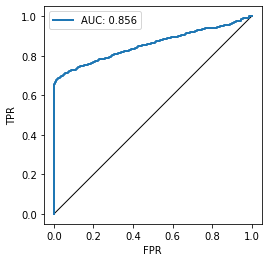

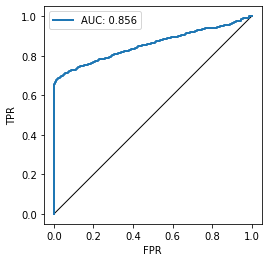

In [83]:
import tensorflow_privacy.privacy.membership_inference_attack.plotting as miaplt
miaplt.plot_roc_curve(attacks_result5.get_result_with_max_auc().roc_curve)

In [84]:
# PRE

We can observe that the attack accuracy on each subset is varying, were for one subset we got 0.53 auc score & followed by 0.53 / 0.55 / 0.56 / 0.65 consecativly for remaining subsets.

We see an inconsistency with the accuracy & model 5 seems to gives us the highest auc value.

# Attack on Subset 1 - MLP Attack





In [85]:
###  define what variables our attacker should have access to

attack_inputp1 = AttackInputData(
  logits_train = logits_train1,
  logits_test = logits_test1,
  labels_train = d1_label.reshape(d1_label.shape[0]),
  labels_test = y_test.reshape(y_test.shape[0],)
) 

In [86]:
## the data slicing is kept same as during threshold attack
#defining the attack type
attack_types2 = [
    AttackType.MULTI_LAYERED_PERCEPTRON
] 

In [87]:
attacks_resultp1 = mia.run_attacks(attack_input=attack_inputp1,
                                 slicing_spec=slicing_spec,
                                 attack_types=attack_types2)

/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:

In [88]:
attacks_resultp1.summary()

'Best-performing attacks over all slices\n  MULTI_LAYERED_PERCEPTRON (with 1000 training and 1000 test examples) achieved an AUC of 0.53 on slice CLASS=0\n  MULTI_LAYERED_PERCEPTRON (with 1000 training and 1000 test examples) achieved an advantage of 0.07 on slice CLASS=9\n  MULTI_LAYERED_PERCEPTRON (with 1000 training and 1000 test examples) achieved a positive predictive value of 1.00 on slice CLASS=0'

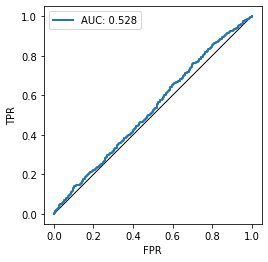

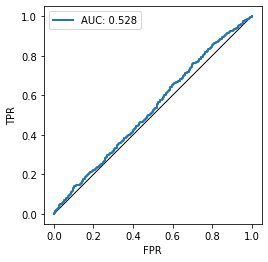

In [89]:
miaplt.plot_roc_curve(attacks_resultp1.get_result_with_max_auc().roc_curve)

# Attack on Subset 2 - MLP Attack





In [90]:
###  define what variables our attacker should have access to

attack_inputp2 = AttackInputData(
  logits_train = logits_train2,
  logits_test = logits_test2,
  labels_train = d2_label.reshape(d2_label.shape[0]),
  labels_test = y_test.reshape(y_test.shape[0],)
) 

In [91]:
## the data slicing is kept same as during threshold attack
#defining the attack type
attack_types2 = [
    AttackType.MULTI_LAYERED_PERCEPTRON
] 

In [92]:
attacks_resultp2 = mia.run_attacks(attack_input=attack_inputp2,
                                 slicing_spec=slicing_spec,
                                 attack_types=attack_types2)

/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:

In [93]:
attacks_resultp2.summary()

'Best-performing attacks over all slices\n  MULTI_LAYERED_PERCEPTRON (with 1000 training and 1000 test examples) achieved an AUC of 0.53 on slice CLASS=7\n  MULTI_LAYERED_PERCEPTRON (with 1000 training and 1000 test examples) achieved an advantage of 0.07 on slice CLASS=2\n  MULTI_LAYERED_PERCEPTRON (with 1000 training and 1000 test examples) achieved a positive predictive value of 1.00 on slice CLASS=0'

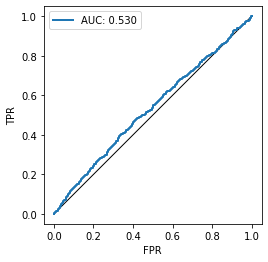

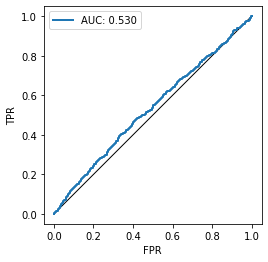

In [94]:
miaplt.plot_roc_curve(attacks_resultp2.get_result_with_max_auc().roc_curve)

# Attack on Subset 3 - MLP Attack





In [95]:
###  define what variables our attacker should have access to

attack_inputp3 = AttackInputData(
  logits_train = logits_train3,
  logits_test = logits_test3,
  labels_train = d3_label.reshape(d3_label.shape[0]),
  labels_test = y_test.reshape(y_test.shape[0],)
) 

In [96]:
## the data slicing is kept same as during threshold attack
#defining the attack type
attack_types2 = [
    AttackType.MULTI_LAYERED_PERCEPTRON
] 

In [97]:
attacks_resultp3 = mia.run_attacks(attack_input=attack_inputp3,
                                 slicing_spec=slicing_spec,
                                 attack_types=attack_types2)

/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:

In [98]:
attacks_resultp3.summary()

'Best-performing attacks over all slices\n  MULTI_LAYERED_PERCEPTRON (with 1000 training and 1000 test examples) achieved an AUC of 0.53 on slice CLASS=7\n  MULTI_LAYERED_PERCEPTRON (with 1000 training and 1000 test examples) achieved an advantage of 0.07 on slice CLASS=5\n  MULTI_LAYERED_PERCEPTRON (with 10000 training and 10000 test examples) achieved a positive predictive value of 1.00 on slice Entire dataset'

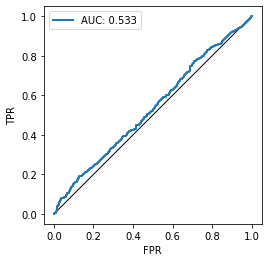

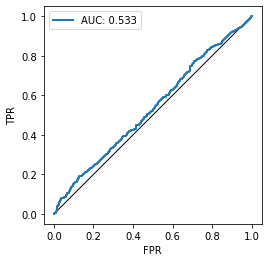

In [99]:
miaplt.plot_roc_curve(attacks_resultp3.get_result_with_max_auc().roc_curve)

# Attack on Subset 4 - MLP Attack





In [100]:
###  define what variables our attacker should have access to

attack_inputp4 = AttackInputData(
  logits_train = logits_train4,
  logits_test = logits_test4,
  labels_train = d4_label.reshape(d4_label.shape[0]),
  labels_test = y_test.reshape(y_test.shape[0],)
) 

In [101]:
## the data slicing is kept same as during threshold attack
#defining the attack type
attack_types2 = [
    AttackType.MULTI_LAYERED_PERCEPTRON
] 

In [102]:
attacks_resultp4 = mia.run_attacks(attack_input=attack_inputp4,
                                 slicing_spec=slicing_spec,
                                 attack_types=attack_types2)

/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:

In [103]:
attacks_resultp4.summary()

'Best-performing attacks over all slices\n  MULTI_LAYERED_PERCEPTRON (with 1000 training and 1000 test examples) achieved an AUC of 0.57 on slice CLASS=4\n  MULTI_LAYERED_PERCEPTRON (with 1000 training and 1000 test examples) achieved an advantage of 0.11 on slice CLASS=3\n  MULTI_LAYERED_PERCEPTRON (with 1000 training and 1000 test examples) achieved a positive predictive value of 1.00 on slice CLASS=2'

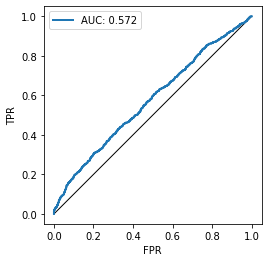

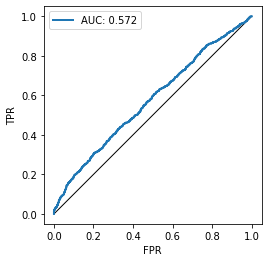

In [104]:
miaplt.plot_roc_curve(attacks_resultp4.get_result_with_max_auc().roc_curve)

# Attack on Subset 5 - MLP Attack





In [105]:
###  define what variables our attacker should have access to

attack_inputp5 = AttackInputData(
  logits_train = logits_train5,
  logits_test = logits_test5,
  labels_train = d5_label.reshape(d5_label.shape[0]),
  labels_test = y_test.reshape(y_test.shape[0],)
) 

In [106]:
## the data slicing is kept same as during threshold attack
#defining the attack type
attack_types2 = [
    AttackType.MULTI_LAYERED_PERCEPTRON
] 

In [107]:
attacks_resultp5 = mia.run_attacks(attack_input=attack_inputp5,
                                 slicing_spec=slicing_spec,
                                 attack_types=attack_types2)

/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:

In [108]:
attacks_resultp5.summary()

'Best-performing attacks over all slices\n  MULTI_LAYERED_PERCEPTRON (with 1000 training and 1000 test examples) achieved an AUC of 0.81 on slice CLASS=3\n  MULTI_LAYERED_PERCEPTRON (with 1000 training and 1000 test examples) achieved an advantage of 0.56 on slice CLASS=3\n  MULTI_LAYERED_PERCEPTRON (with 10000 training and 10000 test examples) achieved a positive predictive value of 1.00 on slice Entire dataset'

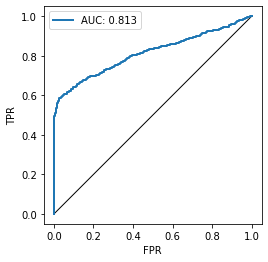

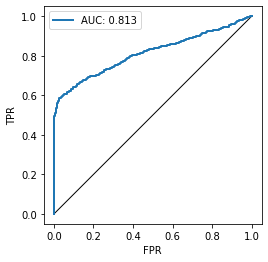

In [109]:
miaplt.plot_roc_curve(attacks_resultp5.get_result_with_max_auc().roc_curve)

We can observe that the attack accuracy on each subset is varying, were for one subset we got 0.515 auc score & followed by 0.531 / 0.537 / 0.528 / 0.616 consecativly for remaining subsets.

We see an inconsistency with the accuracy & model 5 seems to gives us the highest auc value.

# Combination of probability vectors [with highest confidence]

In [110]:
logits_pre = [] ## pre-attack train logit
indext = 0
for p in logits_train1:
  logits_pre.append(p)
  indext+=1
indext2 = 0
for p in logits_train2:
  logits_pre.append(p)
  indext2+=1
indext3 = 0
for p in logits_train3:
  logits_pre.append(p)
  indext3+=1

indext4 = 0
for p in logits_train5:
  logits_pre.append(p)
  indext4+=1

indext5 = 0
for p in logits_train5:
  logits_pre.append(p)
  indext5+=1

In [111]:
label_pre = np.concatenate((d1_label,d2_label,d3_label,d4_label,d5_label))


In [112]:
agg_array_pre = np.asarray(logits_pre)
type(agg_array_pre)
agg_array_pre.shape

(50000, 10)

In [113]:
A = agg_array_pre
list_of_index = np.random.randint(40000,size=10000) ## 40000 is the size of A
list_of_index

array([ 3578, 30331,    81, ..., 18725,  8633,  5249])

In [114]:
Attack_logit_pre = agg_array_pre[list_of_index,:]
Attack_label_pre = label_pre[list_of_index,:]

In [115]:
logits_test1.shape

(10000, 10)

In [116]:
##Attack on ensemble pre exclusion
attack_inputpre = AttackInputData(
  logits_train = Attack_logit_pre,
  logits_test = logits_test1,
  labels_train = Attack_label_pre.reshape(Attack_label_pre.shape[0]),
  labels_test = y_test.reshape(y_test.shape[0],)
) 

## MLP ATTACK

In [117]:
attacks_resultpre = mia.run_attacks(attack_input=attack_inputpre,
                                 slicing_spec=slicing_spec,
                                 attack_types=attack_types2)

/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:

In [118]:
attacks_resultpre.summary()

'Best-performing attacks over all slices\n  MULTI_LAYERED_PERCEPTRON (with 4508 training and 3417 test examples) achieved an AUC of 0.67 on slice CORRECTLY_CLASSIFIED=False\n  MULTI_LAYERED_PERCEPTRON (with 4508 training and 3417 test examples) achieved an advantage of 0.25 on slice CORRECTLY_CLASSIFIED=False\n  MULTI_LAYERED_PERCEPTRON (with 1071 training and 1000 test examples) achieved a positive predictive value of 0.91 on slice CLASS=2'

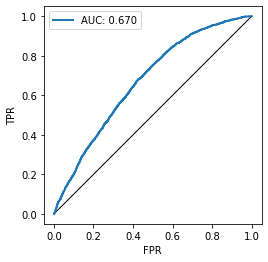

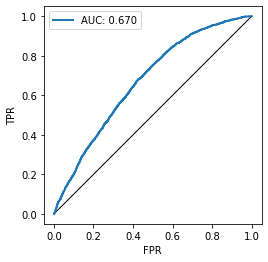

In [119]:
### GRAPH
miaplt.plot_roc_curve(attacks_resultpre.get_result_with_max_auc().roc_curve)

In [120]:
print('Apply softmax to get probabilities from attack logits...')
prob_train_attack_pre = tf.nn.softmax(Attack_logit_pre, axis=-1)
prob_test_attack_pre = tf.nn.softmax(logits_test1)

# print('Compute losses...')
# cce = tf.keras.backend.categorical_crossentropy
# constant = tf.keras.backend.constant

y_train_fifthhot_pre = to_categorical(Attack_label_pre)
y_test_fifthhot_pre = to_categorical(y_test)

loss_train_attack_pre = cce(constant(y_train_fifthhot_pre), constant(prob_train_attack_pre), from_logits=False).numpy()
loss_test_attack_pre = cce(constant(y_test_fifthhot_pre), constant(prob_test_attack_pre), from_logits=False).numpy()

Apply softmax to get probabilities from attack logits...


## Threshold Attack

In [121]:
## Threshold attack inputs for pre exclusion attack
attack_inputpre_th = AttackInputData(
  logits_train = Attack_logit_pre,
  logits_test = logits_test1,
  loss_train = loss_train_attack_pre ,
  loss_test = loss_test_attack_pre,
  labels_train = Attack_label_pre.reshape(Attack_label_pre.shape[0]),
  labels_test = y_test.reshape(y_test.shape[0],)
) 

In [122]:
attacks_resultpre_th = mia.run_attacks(attack_input=attack_inputpre_th,
                                 slicing_spec=slicing_spec,
                                 attack_types=attack_types)

In [123]:
attacks_resultpre_th.summary()

'Best-performing attacks over all slices\n  LOGISTIC_REGRESSION (with 4508 training and 3417 test examples) achieved an AUC of 0.68 on slice CORRECTLY_CLASSIFIED=False\n  LOGISTIC_REGRESSION (with 4508 training and 3417 test examples) achieved an advantage of 0.30 on slice CORRECTLY_CLASSIFIED=False\n  LOGISTIC_REGRESSION (with 965 training and 1000 test examples) achieved a positive predictive value of 1.00 on slice CLASS=1'

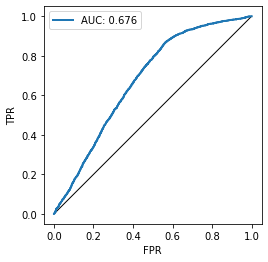

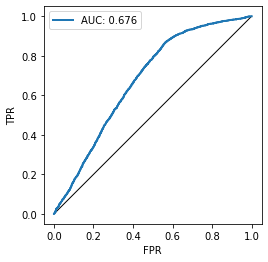

In [124]:
miaplt.plot_roc_curve(attacks_resultpre_th.get_result_with_max_auc().roc_curve)

# ***Confidence Exclusion***

> Indented block



### Capture the highest confidence value - subset1




In [125]:
### List for model probabilities
# 1- For our prediction verctors, we need to find the index with the highest confidence ( for all of them in that vector )
# 2- Once we have results, we will take them all within one list and figure out the highest value in that list

### subset 4 / capture highest confidence value
max_confident_value_1 = max(map(max, logits_train1))
print(max_confident_value_1)


57.385067


### Capture the highest confidence value - subset2






In [126]:
# m = list(map(max, logits_train1))
# sorted(m,reverse=True)




In [127]:
### subset 2 / capture highest confidence value

max_confident_value_2 = max(map(max, logits_train2))
print(max_confident_value_2)


63.24618


### Capture the highest confidence value - subset3

In [128]:
### subset 3 / capture highest confidence value

max_confident_value_3 = max(map(max, logits_train3))
print(max_confident_value_3)


65.957306


### Capture the highest confidence value - subset4

In [129]:
### subset 4 / capture highest confidence value

max_confident_value_4 = max(map(max, logits_train4))
print(max_confident_value_4)


54.525734


### Capture the highest confidence value - subset5

In [130]:
### subset 5 / capture highest confidence value

max_confident_value_5 = max(map(max, logits_train5))
print(max_confident_value_5)


63.15676


### Aggregate highest confidence subset into a list

In [131]:
### aggreate all max confident values into singelton list

aggregated_confident_values = (max_confident_value_1, max_confident_value_2, max_confident_value_3, max_confident_value_4, max_confident_value_5)
print(aggregated_confident_values)
aggregated_conf_index = aggregated_confident_values.index(max(aggregated_confident_values))
print( "Model # to be Excluded: " ,aggregated_conf_index)


(57.385067, 63.24618, 65.957306, 54.525734, 63.15676)
Model # to be Excluded:  2


We are excluding model 4 since it provides the highest confident.

# Run attack post Exclusion


In [132]:
 logits_ensemble = []
# logits_ensemble.append(logits_train1)
# logits_ensemble.append(logits_train2)
# logits_ensemble.append(logits_train3)
# logits_ensemble.append(logits_train5)

# print(len(logits_ensemble))
# logits_ensemble

In [133]:
indext = 0
for p in logits_train1:
  logits_ensemble.append(p)
  indext+=1
indext2 = 0
for p in logits_train2:
  logits_ensemble.append(p)
  indext2+=1
indext3 = 0
for p in logits_train3:
  logits_ensemble.append(p)
  indext3+=1
indext5 = 0
for p in logits_train5:
  logits_ensemble.append(p)
  indext5+=1

In [134]:
logits_ensemble

[array([  8.911482 , -15.4684725,  23.85061  , -11.745159 ,  -6.4384823,
        -13.128543 ,  -4.656077 , -16.187746 , -12.368537 , -25.694088 ],
       dtype=float32),
 array([ 11.373917 ,  -7.940238 ,  -6.5945587, -25.489458 ,  -7.601053 ,
         -5.022132 , -23.380957 ,  -8.758195 ,  -2.378265 ,  13.505583 ],
       dtype=float32),
 array([-17.93547  , -18.557564 ,   3.0656326,   1.1383592,   5.1704736,
          2.3822527,  -0.9689072,  -1.1212664, -20.562218 , -19.63227  ],
       dtype=float32),
 array([  0.2232852, -21.797968 ,  -3.6375186,  12.005256 ,  -8.777237 ,
          4.720694 , -13.222497 , -12.929618 , -21.835749 , -13.165231 ],
       dtype=float32),
 array([ -4.0395327, -21.983978 ,  14.967894 ,   1.0718615, -18.24403  ,
          7.7063184, -23.164095 ,  -1.7945548, -17.833477 ,  -6.397946 ],
       dtype=float32),
 array([ -8.391929  , -23.617134  ,   9.693177  ,  -0.73168194,
          5.36682   ,  -1.4639732 , -10.958794  ,  -1.5083854 ,
        -24.720783  , 

In [135]:
print(d1_label)

[[2]
 [2]
 [2]
 ...
 [9]
 [1]
 [1]]


In [136]:
## ensembling the labels for train
label_ensemble = np.concatenate((d1_label,d2_label,d3_label,d5_label))
# m1 = d1_label.reshape(d1_label.shape[0])




In [137]:
label_ensemble.shape

(40000, 1)

In [138]:
# label_ensemble.append(m1)
# label_ensemble.append(d2_label.reshape(d2_label.shape[0]))
# label_ensemble.append(d3_label.reshape(d3_label.shape[0]))
# label_ensemble.append(d5_label.reshape(d5_label.shape[0]))


In [139]:
len(label_ensemble)

40000

## Threshold attack

In [140]:
agg_array = np.asarray(logits_ensemble)
type(agg_array)
agg_array.shape

(40000, 10)

In [141]:
logits_test1.shape

(10000, 10)

In [142]:
temp = d1_label.reshape(d1_label.shape[0])
temp.shape

(10000,)

In [143]:
list_of_index.shape

(10000,)

In [144]:
len(list_of_index)

10000

In [145]:
mx= agg_array[[1845,784],:]
mx.shape

(2, 10)

In [146]:
Attack_logit = agg_array[list_of_index,:]
Attack_label = label_ensemble[list_of_index,:]

In [147]:
Attack_label.shape

(10000, 1)

In [148]:
Attack_logit.shape

(10000, 10)

In [149]:
loss_train1.shape

(10000,)

In [150]:
print('Apply softmax to get probabilities from attack logits...')
prob_train_attack = tf.nn.softmax(Attack_logit, axis=-1)
prob_test_attack = tf.nn.softmax(logits_test1)

# print('Compute losses...')
# cce = tf.keras.backend.categorical_crossentropy
# constant = tf.keras.backend.constant

y_train_fifthhot = to_categorical(Attack_label)
y_test_fifthhot = to_categorical(y_test)

loss_train_attack = cce(constant(y_train_fifthhot), constant(prob_train_attack), from_logits=False).numpy()
loss_test_attack = cce(constant(y_test_fifthhot), constant(prob_test_attack), from_logits=False).numpy()

Apply softmax to get probabilities from attack logits...


In [151]:
attack_input_pe_th = AttackInputData(
  logits_train = Attack_logit,
  logits_test = logits_test1,
  loss_train = loss_train_attack,
  loss_test = loss_test_attack,
  labels_train = Attack_label.reshape(Attack_label.shape[0],),
  labels_test = y_test.reshape(y_test.shape[0],)
) 

In [152]:
attacks_result_pe_th = mia.run_attacks(attack_input=attack_input_pe_th,
                                 slicing_spec=slicing_spec,
                                 attack_types=attack_types)

In [153]:
attacks_result_pe_th.summary()

'Best-performing attacks over all slices\n  THRESHOLD_ATTACK (with 973 training and 1000 test examples) achieved an AUC of 0.61 on slice CLASS=4\n  THRESHOLD_ATTACK (with 1018 training and 1000 test examples) achieved an advantage of 0.21 on slice CLASS=3\n  LOGISTIC_REGRESSION (with 974 training and 1000 test examples) achieved a positive predictive value of 1.00 on slice CLASS=1'

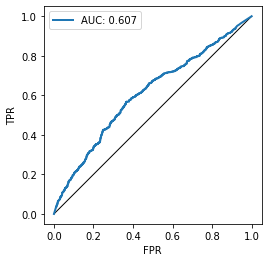

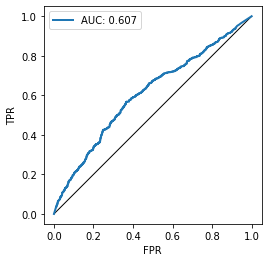

In [154]:
miaplt.plot_roc_curve(attacks_result_pe_th.get_result_with_max_auc().roc_curve)

## MLP ATTACK

In [155]:
attack_input_pe = AttackInputData(
  logits_train = Attack_logit,
  logits_test = logits_test1,
  # loss_train = loss_train1,
  # loss_test = loss_test1,
  labels_train = Attack_label.reshape(Attack_label.shape[0],),
  labels_test = y_test.reshape(y_test.shape[0],)
) 

In [156]:
attacks_result_pe = mia.run_attacks(attack_input=attack_input_pe,
                                 slicing_spec=slicing_spec,
                                 attack_types=attack_types2)

/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:

In [157]:
print(attacks_result_pe)

AttackResults(single_attack_results=[SingleAttackResult(slice_spec=SingleSliceSpec(feature=None, value=None), data_size=DataSize(ntrain=10000, ntest=10000), attack_type=<AttackType.MULTI_LAYERED_PERCEPTRON: 'mlp'>, roc_curve=RocCurve(thresholds=array([1.98020077, 0.98020077, 0.96410453, ..., 0.07528488, 0.06640925,
       0.04379214]), tpr=array([0.000e+00, 0.000e+00, 1.000e-04, ..., 9.997e-01, 9.997e-01,
       1.000e+00]), fpr=array([0.000e+00, 1.000e-04, 1.000e-04, ..., 9.998e-01, 1.000e+00,
       1.000e+00]), test_train_ratio=1.0), membership_scores_train=array([0.37303302, 0.46564686, 0.43831971, ..., 0.60850447, 0.60436428,
       0.28809854]), membership_scores_test=array([0.40970975, 0.52172244, 0.6214928 , ..., 0.43676713, 0.1584945 ,
       0.51599747])), SingleAttackResult(slice_spec=SingleSliceSpec(feature=<SlicingFeature.CLASS: 'class'>, value=0), data_size=DataSize(ntrain=1021, ntest=1000), attack_type=<AttackType.MULTI_LAYERED_PERCEPTRON: 'mlp'>, roc_curve=RocCurve(thre

In [158]:
attacks_result_pe.summary()

'Best-performing attacks over all slices\n  MULTI_LAYERED_PERCEPTRON (with 1018 training and 1000 test examples) achieved an AUC of 0.58 on slice CLASS=3\n  MULTI_LAYERED_PERCEPTRON (with 1018 training and 1000 test examples) achieved an advantage of 0.14 on slice CLASS=3\n  MULTI_LAYERED_PERCEPTRON (with 973 training and 1000 test examples) achieved a positive predictive value of 1.00 on slice CLASS=4'

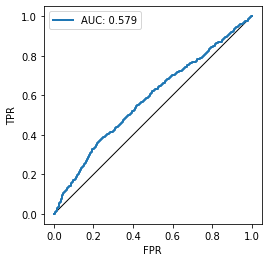

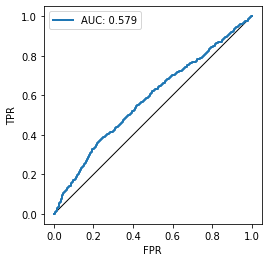

In [159]:
miaplt.plot_roc_curve(attacks_result_pe.get_result_with_max_auc().roc_curve)